In [212]:
%matplotlib inline
import xarray as xr
import numpy as np
import matplotlib.pyplot as plt
import os
import warnings
import contextily
import matplotlib.colors as colors
import matplotlib.patches as mpatches
from matplotlib.transforms import Affine2D
import mpl_toolkits.axisartist.floating_axes as floating_axes
import cartopy
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from mpl_toolkits.basemap import Basemap
import windrose
import datetime
import pandas
import imageio
from pathlib import Path
from IPython.display import Image

warnings.filterwarnings('ignore')

import warnings
warnings.filterwarnings('ignore')

In [213]:
#Biochemistry

In [214]:
MYPATH = os.path.join('D:/Daten/CodingEO/Eigene_Projekte/')

In [215]:
input_root    = os.path.join(MYPATH,'Data')
input_path = "biogeochemistry"
file_name_chl = 'cmems_mod_glo_bgc_my_0.25_P1D-m_1673362677639.nc'

In [216]:
OLCI_file = xr.open_dataset(os.path.join(input_root,input_path,file_name_chl))
OLCI_file

<xarray.Dataset>
Dimensions:    (time: 1, depth: 1, latitude: 148, longitude: 173)
Coordinates:
  * depth      (depth) float32 0.5058
  * latitude   (latitude) float32 35.25 35.5 35.75 36.0 ... 71.5 71.75 72.0
  * time       (time) datetime64[ns] 2020-12-31T12:00:00
  * longitude  (longitude) float32 -14.75 -14.5 -14.25 ... 27.75 28.0 28.25
Data variables:
    no3        (time, depth, latitude, longitude) float32 ...
    o2         (time, depth, latitude, longitude) float32 ...
    po4        (time, depth, latitude, longitude) float32 ...
    chl        (time, depth, latitude, longitude) float32 ...
    si         (time, depth, latitude, longitude) float32 ...
    nppv       (time, depth, latitude, longitude) float32 ...
Attributes: (12/17)
    product:                       GLOBAL_REANALYSIS_BIO_001_029
    producer:                      CMEMS - Global Monitoring and Forecasting ...
    title:                         Daily mean fields for product GLOBAL_REANA...
    area:                          GLOBAL
    quality_information_document:  http://marine.copernicus.eu/documents/QUID...
    Conventions:                   CF-1.6
    ...                            ...
    dataset:                       global-reanalysis-bio-001-029-daily
    institution:                   Mercator Ocean
    product_user_manual:           http://marine.copernicus.eu/documents/PUM/...
    _CoordSysBuilder:              ucar.nc2.dataset.conv.CF1Convention
    comment:                       
    history:                       Data extracted from dataset http://localho...

In [217]:
NO3_data = OLCI_file.no3.data
NO3 = NO3_data[0][0]

O2_data = OLCI_file.o2.data
O2 = O2_data[0][0]

PO4_data = OLCI_file.po4.data
PO4 = PO4_data[0][0]

CHL_data = OLCI_file.chl.data
CHL = CHL_data[0][0]

SI_data = OLCI_file.si.data
SI = SI_data[0][0]

NPPV_data = OLCI_file.nppv.data
NPPV = NPPV_data[0][0]

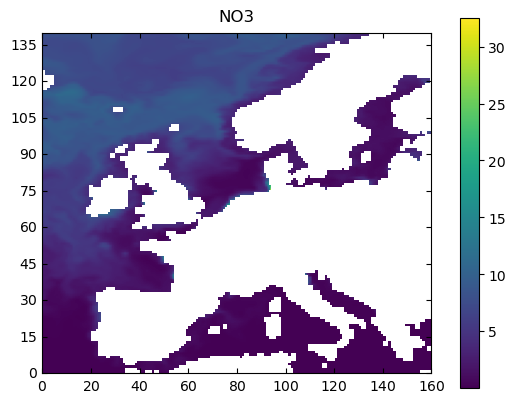

In [218]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("NO3")
fig_no3 = plt.imshow(NO3)
fig1.colorbar(fig_no3)
fig1.savefig('biogeochemistry_NO3.png', bbox_inches='tight')
plt.show()   

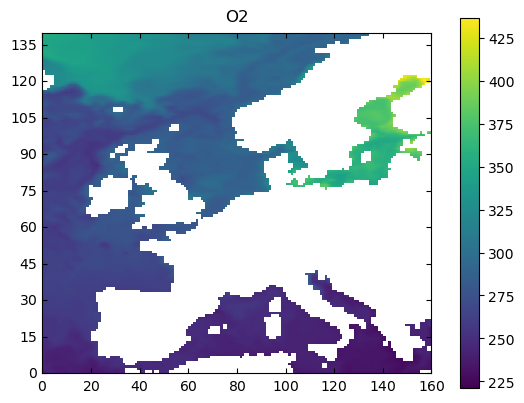

In [219]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("O2")
fig_o2 = plt.imshow(O2)
fig1.colorbar(fig_o2)
fig1.savefig('biogeochemistry_O2.png', bbox_inches='tight')
plt.show()

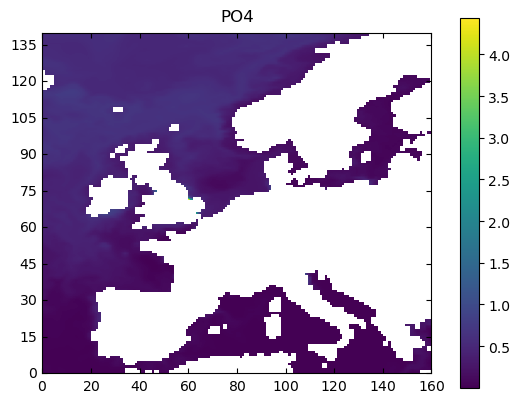

In [220]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("PO4")
fig_po4 = plt.imshow(PO4)
fig1.colorbar(fig_po4)
fig1.savefig('biogeochemistry_PO4.png', bbox_inches='tight')
plt.show()

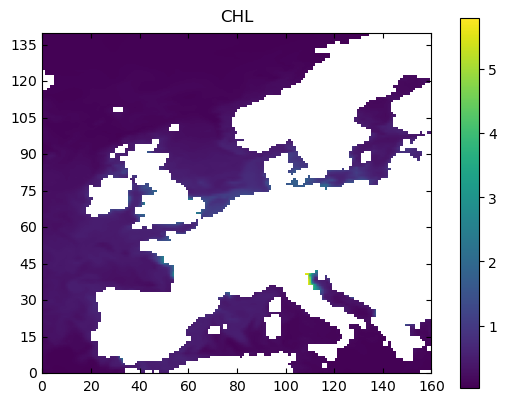

In [221]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("CHL")
fig_chl = plt.imshow(CHL)
fig1.colorbar(fig_chl)
fig1.savefig('biogeochemistry_CHL.png', bbox_inches='tight')
plt.show()

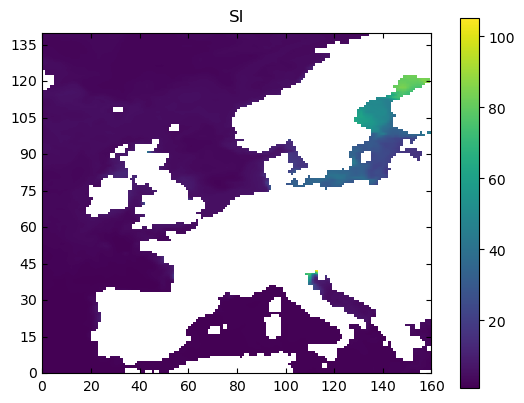

In [222]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("SI")
fig_si = plt.imshow(SI)
fig1.colorbar(fig_si)
fig1.savefig('biogeochemistry_SI.png', bbox_inches='tight')
plt.show()

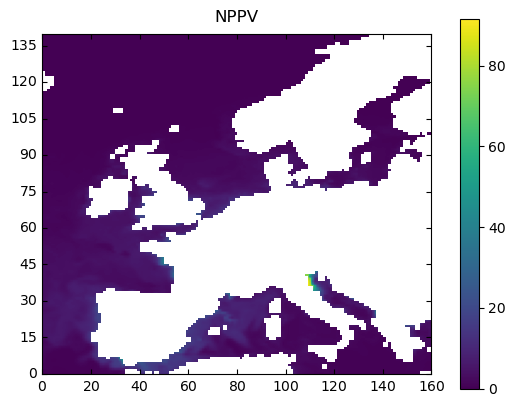

In [223]:
fig1 = plt.figure()
scales = (0, 160, 0, 140)
t = Affine2D().rotate_deg(0)
h = floating_axes.GridHelperCurveLinear(t, scales)
ax = floating_axes.FloatingSubplot(fig1, 111, grid_helper=h)
fig1.add_subplot(ax)
plt.title("NPPV")
fig_nppv = plt.imshow(NPPV)
fig1.colorbar(fig_nppv)
fig1.savefig('biogeochemistry_NPPV.png', bbox_inches='tight')
plt.show()

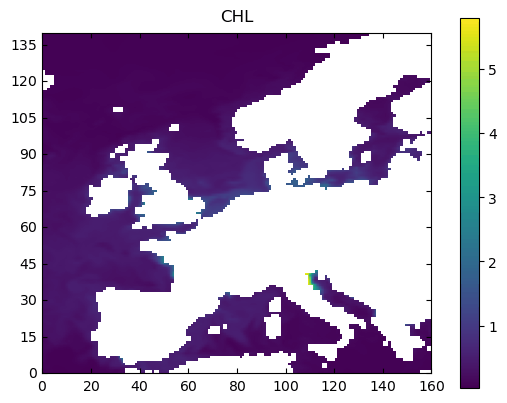

In [224]:
#GIF

image_path = Path('')
images = sorted(image_path.glob('biogeochemistry_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))

imageio.mimwrite('animated_biogeochemistry.gif',image_list,duration=0.5,loop=10)

with open('animated_biogeochemistry.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

In [225]:
#Arctic

In [229]:
path_mod = 'D:/Daten/CodingBaltic/Beginner - overview (1)/Beginner - overview/data/cmems_mod_arc_phy_my_topaz4_P1M_1648045727744.nc'
path_sat = 'D:/Daten/CodingBaltic/Beginner - overview (1)/Beginner - overview/data/cdr_ice_thick_nh_1648046116767.nc'
path_profiler = 'D:/Daten/CodingBaltic/Beginner - overview (1)/Beginner - overview/data/AR_PR_CT_58JH_201711.nc'

mod = xr.open_dataset(path_mod)
sat = xr.open_dataset(path_sat)
profiler = xr.open_dataset(path_profiler)
mod_opendap = mod

In [230]:
mod

<xarray.Dataset>
Dimensions:        (depth: 40, time: 12, y: 359, x: 359)
Coordinates:
  * depth          (depth) float32 0.0 2.0 3.0 4.0 ... 2e+03 3e+03 3.5e+03 4e+03
    latitude       (y, x) float32 ...
  * x              (x) float32 -22.38 -22.25 -22.12 -22.0 ... 22.12 22.25 22.38
  * y              (y) float32 -22.38 -22.25 -22.12 -22.0 ... 22.12 22.25 22.38
  * time           (time) datetime64[ns] 2020-01-15 2020-02-15 ... 2020-12-15
    longitude      (y, x) float32 ...
Data variables:
    stereographic  int32 ...
    siconc         (time, y, x) float32 ...
    model_depth    (y, x) float32 ...
    sithick        (time, y, x) float32 ...
    so             (time, depth, y, x) float32 ...
Attributes:
    institution:                     NERSC, Thormoehlens gate 47, N-5006 Berg...
    history:                         20211013:Created by program hyc2proj, ve...
    source:                          NERSC-HYCOM model fields
    references:                      http://topaz.nersc.no
    FROM_ORIGINAL_FILE__field_type:  Files based on file type nersc_weekly
    Conventions:                     CF-1.4
    title:                           Arctic Ocean Physics Reanalysis, 12.5km ...
    field_date:                      2020-12-15
    version:                         v4b
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    comment:

In [231]:
ice_thickness_mod = mod.sithick
ice_thickness_mod.max()

<xarray.DataArray 'sithick' ()>
array(8.21788025)

In [233]:
ice_thickness_mod = mod['sithick'].data

In [234]:
sat['time']

<xarray.DataArray 'time' (time: 90)>
array(['2002-10-01T00:00:00.000000000', '2002-11-01T00:00:00.000000000',
       '2002-12-01T00:00:00.000000000', '2003-01-01T00:00:00.000000000',
       '2003-02-01T00:00:00.000000000', '2003-03-01T00:00:00.000000000',
       '2003-04-01T00:00:00.000000000', '2003-10-01T00:00:00.000000000',
       '2003-11-01T00:00:00.000000000', '2003-12-01T00:00:00.000000000',
       '2004-01-01T00:00:00.000000000', '2004-02-01T00:00:00.000000000',
       '2004-03-01T00:00:00.000000000', '2004-04-01T00:00:00.000000000',
       '2004-10-01T00:00:00.000000000', '2004-11-01T00:00:00.000000000',
       '2004-12-01T00:00:00.000000000', '2005-01-01T00:00:00.000000000',
       '2005-02-01T00:00:00.000000000', '2005-03-01T00:00:00.000000000',
       '2005-04-01T00:00:00.000000000', '2005-10-01T00:00:00.000000000',
       '2005-11-01T00:00:00.000000000', '2005-12-01T00:00:00.000000000',
       '2006-01-01T00:00:00.000000000', '2006-02-01T00:00:00.000000000',
       '2006-03-01T00:00:00.000000000', '2006-04-01T00:00:00.000000000',
       '2006-10-01T00:00:00.000000000', '2006-11-01T00:00:00.000000000',
       '2006-12-01T00:00:00.000000000', '2007-01-01T00:00:00.000000000',
       '2007-02-01T00:00:00.000000000', '2007-03-01T00:00:00.000000000',
       '2007-04-01T00:00:00.000000000', '2007-10-01T00:00:00.000000000',
       '2007-11-01T00:00:00.000000000', '2007-12-01T00:00:00.000000000',
       '2008-01-01T00:00:00.000000000', '2008-02-01T00:00:00.000000000',
       '2008-03-01T00:00:00.000000000', '2008-04-01T00:00:00.000000000',
       '2008-10-01T00:00:00.000000000', '2008-11-01T00:00:00.000000000',
       '2008-12-01T00:00:00.000000000', '2009-01-01T00:00:00.000000000',
       '2009-02-01T00:00:00.000000000', '2009-03-01T00:00:00.000000000',
       '2009-04-01T00:00:00.000000000', '2009-10-01T00:00:00.000000000',
       '2009-11-01T00:00:00.000000000', '2009-12-01T00:00:00.000000000',
       '2010-01-01T00:00:00.000000000', '2010-02-01T00:00:00.000000000',
       '2010-03-01T00:00:00.000000000', '2010-04-01T00:00:00.000000000',
       '2010-10-01T00:00:00.000000000', '2010-11-01T00:00:00.000000000',
       '2010-12-01T00:00:00.000000000', '2011-01-01T00:00:00.000000000',
       '2011-02-01T00:00:00.000000000', '2011-03-01T00:00:00.000000000',
       '2011-04-01T00:00:00.000000000', '2011-10-01T00:00:00.000000000',
       '2011-11-01T00:00:00.000000000', '2011-12-01T00:00:00.000000000',
       '2012-01-01T00:00:00.000000000', '2012-02-01T00:00:00.000000000',
       '2012-03-01T00:00:00.000000000', '2012-04-01T00:00:00.000000000',
       '2012-10-01T00:00:00.000000000', '2012-11-01T00:00:00.000000000',
       '2012-12-01T00:00:00.000000000', '2013-01-01T00:00:00.000000000',
       '2013-02-01T00:00:00.000000000', '2013-03-01T00:00:00.000000000',
       '2013-04-01T00:00:00.000000000', '2013-10-01T00:00:00.000000000',
       '2013-11-01T00:00:00.000000000', '2013-12-01T00:00:00.000000000',
       '2014-01-01T00:00:00.000000000', '2014-02-01T00:00:00.000000000',
       '2014-03-01T00:00:00.000000000', '2014-04-01T00:00:00.000000000',
       '2014-10-01T00:00:00.000000000', '2014-11-01T00:00:00.000000000',
       '2014-12-01T00:00:00.000000000', '2015-01-01T00:00:00.000000000',
       '2015-02-01T00:00:00.000000000', '2015-03-01T00:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2002-10-01 2002-11-01 ... 2015-03-01
Attributes:
    standard_name:        time
    long_name:            reference time of product
    axis:                 T
    bounds:               time_bnds
    _ChunkSizes:          1
    _CoordinateAxisType:  Time
    valid_min:            1033430400.0
    valid_max:            1425168000.0

In [236]:
sat.sel(time='2003-02-01', method='nearest')

<xarray.Dataset>
Dimensions:                 (yc: 178, xc: 178)
Coordinates:
  * yc                      (yc) float64 2.212e+03 2.188e+03 ... -2.212e+03
    lon                     (yc, xc) float64 -135.0 -135.3 -135.7 ... 44.67 45.0
  * xc                      (xc) float64 -2.212e+03 -2.188e+03 ... 2.212e+03
    time                    datetime64[ns] 2003-02-01
    lat                     (yc, xc) float64 61.68 61.84 62.0 ... 61.84 61.68
Data variables:
    Lambert_Azimuthal_Grid  int8 -127
    sea_ice_thickness       (yc, xc) float32 ...
Attributes: (12/43)
    title:                                   Sea Ice Thickness Climate Data R...
    institution:                             Alfred-Wegener-Institut Helmholt...
    source:                                  Altimetry: cryosat2, Snow depth:...
    FROM_ORIGINAL_FILE__platform:            CryoSat-2
    sensor:                                  SIRAL
    history:                                 20180425T193740Z (created)
    ...                                      ...
    time_coverage_duration:                  P1M
    time_coverage_resolution:                P1M
    standard_name_vocabulary:                CF
    license:                                 Creative Commons Attribution 4.0...
    _CoordSysBuilder:                        ucar.nc2.dataset.conv.CF1Convention
    Conventions:                             CF-1.0

Text(0.5, 0.98, 'Sea ice thickness on 2020-02-10')

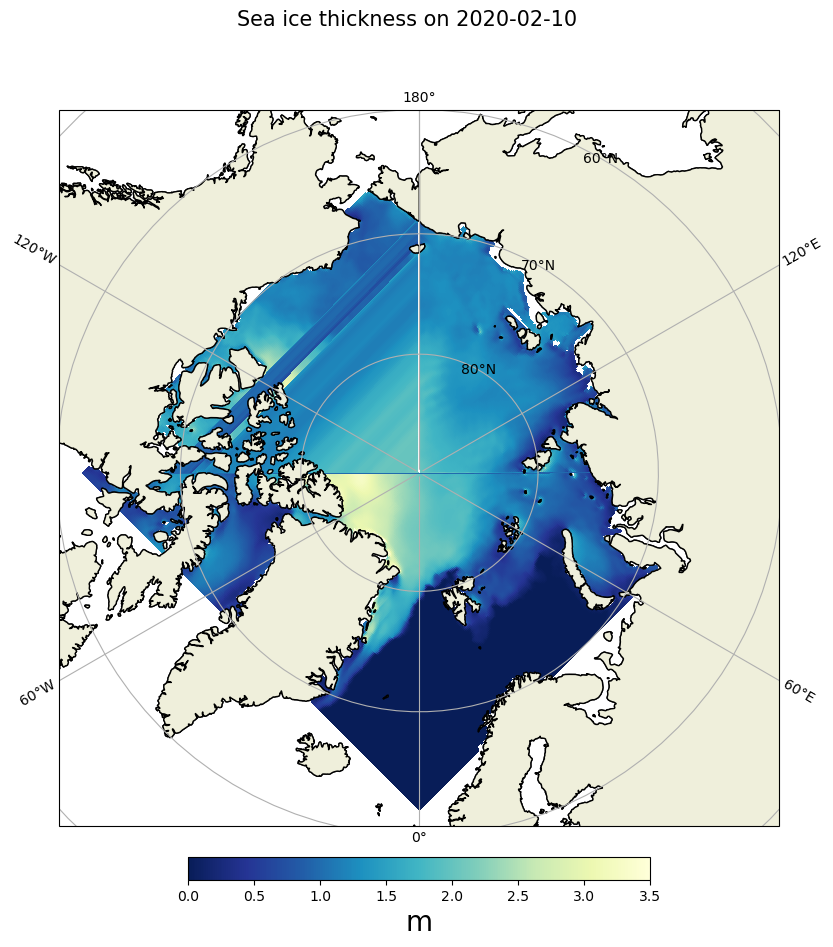

In [238]:
date = '2020-02-10'
ice_thick = mod.sel(time=date,method='nearest')['sithick']

f,ax = plt.subplots(1,1, figsize=(10,10),subplot_kw=dict(projection=ccrs.Stereographic(central_longitude=0,central_latitude=90)))  

im = ax.pcolormesh(ice_thick['longitude'].values, ice_thick['latitude'].values,ice_thick,
                           cmap='YlGnBu_r',vmin=0,vmax=3.5,transform=ccrs.PlateCarree())         

ax.coastlines()                                                   
gl = ax.gridlines(draw_labels=True)                              
ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')        
ax.set_extent([-180,180, 60, 90],crs=ccrs.PlateCarree())      

cbar = f.colorbar(im,ax=ax,fraction=0.03,pad=0.04,orientation='horizontal')      
cbar.set_label('m',fontsize=20)                                                 

f.suptitle('Sea ice thickness on {}'.format(date),fontsize=15)

In [239]:
x = 10
y_min, y_max = -15,12

for i in range(len(mod['time'])):

    sal_mod = mod.sel(x=x,method='nearest').sel(y=slice(y_min,y_max)).isel(time=[i]).squeeze()

    date = np.datetime_as_string(sal_mod['time'].data,unit='D')

    ice_thick = mod.sel(time=date,method='nearest')['sithick']

    f,ax = plt.subplots(1,1, figsize=(10,10),subplot_kw=dict(projection=ccrs.Stereographic(central_longitude=0,central_latitude=90)))  

    im = ax.pcolormesh(ice_thick['longitude'].values, ice_thick['latitude'].values,ice_thick,
                               cmap='YlGnBu_r',vmin=0,vmax=3.5,transform=ccrs.PlateCarree())         

    ax.coastlines()                                                 
    gl = ax.gridlines(draw_labels=True)                               
    ax.add_feature(cfeature.LAND, zorder=1, edgecolor='k')           
    ax.set_extent([-180,180, 60, 90],crs=ccrs.PlateCarree())      

    cbar = f.colorbar(im,ax=ax,fraction=0.03,pad=0.04,orientation='horizontal')   
    cbar.set_label('m',fontsize=20) 
 
    f.suptitle('Sea ice thickness on {}'.format(date),fontsize=15)

    plt.savefig("out/animation/Icethickness_"+str(i)+'.png')   
    print("Figure for {} generated".format(date))                 
    plt.close()                                                  

Figure for 2020-01-15 generated
Figure for 2020-02-15 generated
Figure for 2020-03-15 generated
Figure for 2020-04-15 generated
Figure for 2020-05-15 generated
Figure for 2020-06-15 generated
Figure for 2020-07-15 generated
Figure for 2020-08-15 generated
Figure for 2020-09-15 generated
Figure for 2020-10-15 generated
Figure for 2020-11-15 generated
Figure for 2020-12-15 generated


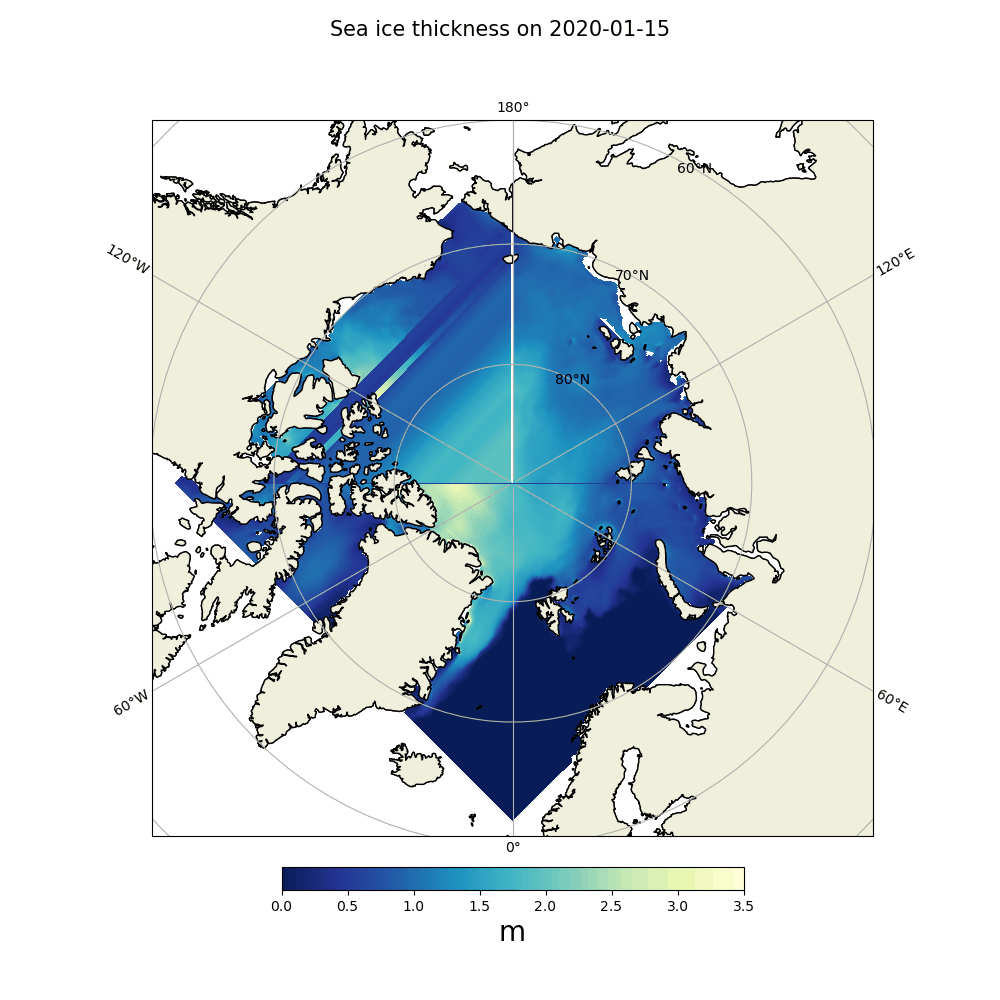

In [240]:
image_path = Path('out/animation')
images = sorted(image_path.glob('Icethickness_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))

imageio.mimwrite('out/animation/Icethickness.gif',image_list,duration=0.5,loop=10)

with open('out/animation/Icethickness.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

In [165]:
#Vertical profiles

In [283]:
idx_1, idx_2, idx_3, idx_4, idx_5, idx_6, idx_7, idx_8, idx_9, idx_10, idx_11, idx_12 = 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11

date_1, date_2 = profiler['TIME'][idx_1].data, profiler['TIME'][idx_2].data
date_3, date_4 = profiler['TIME'][idx_3].data, profiler['TIME'][idx_4].data
date_5, date_6 = profiler['TIME'][idx_5].data, profiler['TIME'][idx_6].data
date_7, date_8 = profiler['TIME'][idx_7].data, profiler['TIME'][idx_8].data
date_9, date_10 = profiler['TIME'][idx_9].data, profiler['TIME'][idx_10].data
date_11, date_12 = profiler['TIME'][idx_11].data, profiler['TIME'][idx_12].data

lon1,lat1 = profiler['LONGITUDE'][idx_1],profiler['LATITUDE'][idx_1]
lon2,lat2 = profiler['LONGITUDE'][idx_2],profiler['LATITUDE'][idx_2]
lon3,lat3 = profiler['LONGITUDE'][idx_3],profiler['LATITUDE'][idx_3]
lon4,lat4 = profiler['LONGITUDE'][idx_4],profiler['LATITUDE'][idx_4]
lon5,lat5 = profiler['LONGITUDE'][idx_5],profiler['LATITUDE'][idx_5]
lon6,lat6 = profiler['LONGITUDE'][idx_6],profiler['LATITUDE'][idx_6]
lon7,lat7 = profiler['LONGITUDE'][idx_7],profiler['LATITUDE'][idx_7]
lon8,lat8 = profiler['LONGITUDE'][idx_8],profiler['LATITUDE'][idx_8]
lon9,lat9 = profiler['LONGITUDE'][idx_9],profiler['LATITUDE'][idx_9]
lon10,lat10 = profiler['LONGITUDE'][idx_10],profiler['LATITUDE'][idx_10]
lon11,lat11 = profiler['LONGITUDE'][idx_11],profiler['LATITUDE'][idx_11]
lon12,lat12 = profiler['LONGITUDE'][idx_12],profiler['LATITUDE'][idx_12]

sal_prof_1 = profiler["PSAL"].isel(TIME=[idx_1]).squeeze()
sal_prof_2 = profiler["PSAL"].isel(TIME=[idx_2]).squeeze()
sal_prof_3 = profiler["PSAL"].isel(TIME=[idx_3]).squeeze()
sal_prof_4 = profiler["PSAL"].isel(TIME=[idx_4]).squeeze()
sal_prof_5 = profiler["PSAL"].isel(TIME=[idx_5]).squeeze()
sal_prof_6 = profiler["PSAL"].isel(TIME=[idx_6]).squeeze()
sal_prof_7 = profiler["PSAL"].isel(TIME=[idx_7]).squeeze()
sal_prof_8 = profiler["PSAL"].isel(TIME=[idx_8]).squeeze()
sal_prof_9 = profiler["PSAL"].isel(TIME=[idx_9]).squeeze()
sal_prof_10 = profiler["PSAL"].isel(TIME=[idx_10]).squeeze()
sal_prof_11 = profiler["PSAL"].isel(TIME=[idx_11]).squeeze()
sal_prof_12 = profiler["PSAL"].isel(TIME=[idx_12]).squeeze()

temp_prof_1 = profiler["TEMP"].isel(TIME=[idx_1]).squeeze()
temp_prof_2 = profiler["TEMP"].isel(TIME=[idx_2]).squeeze()
temp_prof_3 = profiler["TEMP"].isel(TIME=[idx_3]).squeeze()
temp_prof_4 = profiler["TEMP"].isel(TIME=[idx_4]).squeeze()
temp_prof_5 = profiler["TEMP"].isel(TIME=[idx_5]).squeeze()
temp_prof_6 = profiler["TEMP"].isel(TIME=[idx_6]).squeeze()
temp_prof_7 = profiler["TEMP"].isel(TIME=[idx_7]).squeeze()
temp_prof_8 = profiler["TEMP"].isel(TIME=[idx_8]).squeeze()
temp_prof_9 = profiler["TEMP"].isel(TIME=[idx_9]).squeeze()
temp_prof_10 = profiler["TEMP"].isel(TIME=[idx_10]).squeeze()
temp_prof_11 = profiler["TEMP"].isel(TIME=[idx_11]).squeeze()
temp_prof_12 = profiler["TEMP"].isel(TIME=[idx_12]).squeeze()

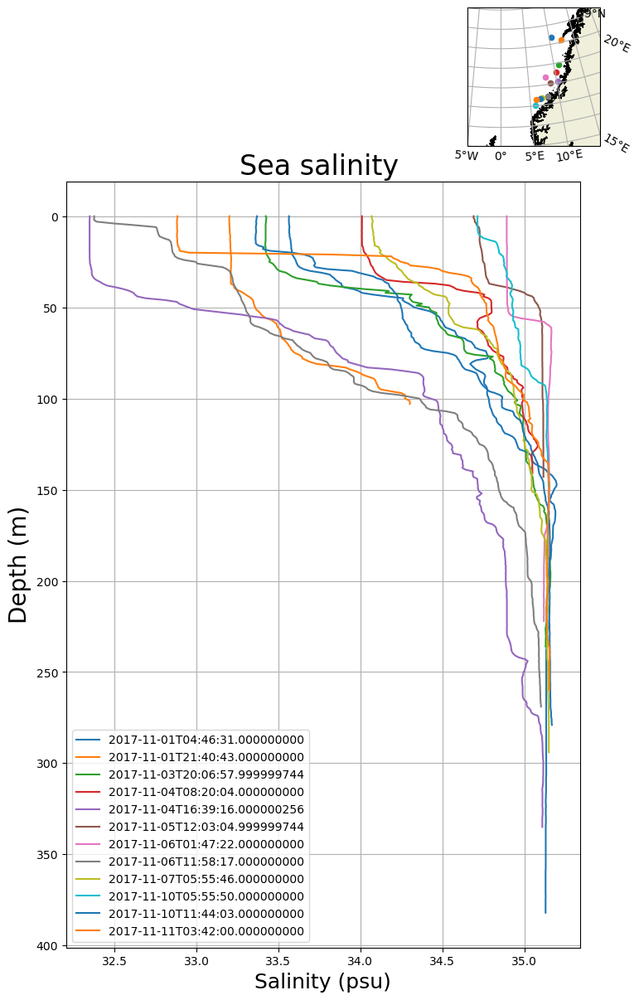

In [242]:
f = plt.figure(figsize=(8,12))                                     
ax = f.add_subplot(111)                                             
ax.grid()                                                         
ax.set_title("Sea salinity ",fontsize=24)                   
ax.invert_yaxis()                                                 
ax.set_xlabel("Salinity (psu)",fontsize=18)                       
ax.set_ylabel("Depth (m)",fontsize=20)                            

im1 = ax.plot(sal_prof_1,sal_prof_2['DEPTH'],label=date_1)                          
im2 = ax.plot(sal_prof_2,sal_prof_2['DEPTH'],label=date_2)                            
im3 = ax.plot(sal_prof_3,sal_prof_3['DEPTH'],label=date_3)                             
im4 = ax.plot(sal_prof_4,sal_prof_4['DEPTH'],label=date_4) 
im5 = ax.plot(sal_prof_5,sal_prof_5['DEPTH'],label=date_5)                             
im6 = ax.plot(sal_prof_6,sal_prof_6['DEPTH'],label=date_6) 
im7 = ax.plot(sal_prof_7,sal_prof_7['DEPTH'],label=date_7)                             
im8 = ax.plot(sal_prof_8,sal_prof_8['DEPTH'],label=date_8) 
im9 = ax.plot(sal_prof_9,sal_prof_9['DEPTH'],label=date_9)                             
im10 = ax.plot(sal_prof_10,sal_prof_10['DEPTH'],label=date_10) 
im11 = ax.plot(sal_prof_11,sal_prof_11['DEPTH'],label=date_11)                             
im12 = ax.plot(sal_prof_12,sal_prof_12['DEPTH'],label=date_12) 

ax_mini_map = f.add_axes([0.73, 0.91, 0.2, 0.15], projection=ccrs.NorthPolarStereo()) 
gl = ax_mini_map.gridlines(draw_labels=True)                                   
gl.right_labels = False                                                        
gl.top_labels = False                                                        
ax_mini_map.add_feature(cfeature.LAND, zorder=1, edgecolor='k')                
ax_mini_map.set_extent([-5, 15, 60, 70],crs=ccrs.PlateCarree())          
ax_mini_map.scatter(lon1, lat1, 20,transform=ccrs.PlateCarree())       
ax_mini_map.scatter(lon2, lat2, 20,transform=ccrs.PlateCarree())        
ax_mini_map.scatter(lon3, lat3, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon4, lat4, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon5, lat5, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon6, lat6, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon7, lat7, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon8, lat8, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon9, lat9, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon10, lat10, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon11, lat11, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon12, lat12, 20,transform=ccrs.PlateCarree())
ax.legend(loc="lower left")                                             

plt.savefig('out/sal_vertical_profile.png')

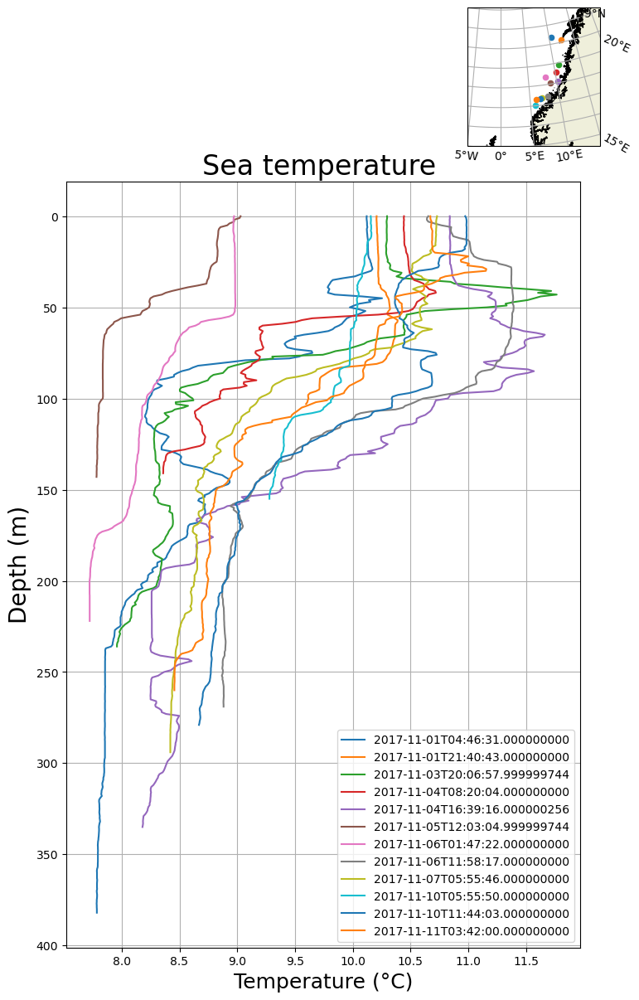

In [285]:
f = plt.figure(figsize=(8,12))                                     
ax = f.add_subplot(111)                                             
ax.grid()                                                         
ax.set_title("Sea temperature ",fontsize=24)                   
ax.invert_yaxis()                                                 
ax.set_xlabel("Temperature (°C)",fontsize=18)                       
ax.set_ylabel("Depth (m)",fontsize=20)                            

im1 = ax.plot(temp_prof_1,temp_prof_2['DEPTH'],label=date_1)                          
im2 = ax.plot(temp_prof_2,temp_prof_2['DEPTH'],label=date_2)                            
im3 = ax.plot(temp_prof_3,temp_prof_3['DEPTH'],label=date_3)                             
im4 = ax.plot(temp_prof_4,temp_prof_4['DEPTH'],label=date_4) 
im5 = ax.plot(temp_prof_5,temp_prof_5['DEPTH'],label=date_5)                             
im6 = ax.plot(temp_prof_6,temp_prof_6['DEPTH'],label=date_6) 
im7 = ax.plot(temp_prof_7,temp_prof_7['DEPTH'],label=date_7)                             
im8 = ax.plot(temp_prof_8,temp_prof_8['DEPTH'],label=date_8) 
im9 = ax.plot(temp_prof_9,temp_prof_9['DEPTH'],label=date_9)                             
im10 = ax.plot(temp_prof_10,temp_prof_10['DEPTH'],label=date_10) 
im11 = ax.plot(temp_prof_11,temp_prof_11['DEPTH'],label=date_11)                             
im12 = ax.plot(temp_prof_12,temp_prof_12['DEPTH'],label=date_12) 

ax_mini_map = f.add_axes([0.73, 0.91, 0.2, 0.15], projection=ccrs.NorthPolarStereo()) 
gl = ax_mini_map.gridlines(draw_labels=True)                                   
gl.right_labels = False                                                        
gl.top_labels = False                                                        
ax_mini_map.add_feature(cfeature.LAND, zorder=1, edgecolor='k')                
ax_mini_map.set_extent([-5, 15, 60, 70],crs=ccrs.PlateCarree())          
ax_mini_map.scatter(lon1, lat1, 20,transform=ccrs.PlateCarree())       
ax_mini_map.scatter(lon2, lat2, 20,transform=ccrs.PlateCarree())        
ax_mini_map.scatter(lon3, lat3, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon4, lat4, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon5, lat5, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon6, lat6, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon7, lat7, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon8, lat8, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon9, lat9, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon10, lat10, 20,transform=ccrs.PlateCarree())
ax_mini_map.scatter(lon11, lat11, 20,transform=ccrs.PlateCarree())         
ax_mini_map.scatter(lon12, lat12, 20,transform=ccrs.PlateCarree())
ax.legend(loc="lower right")                                             

plt.savefig('out/temp_vertical_profile.png')

In [243]:
#waves

In [244]:
REGION_CODE = "05"
NB_CODE = "02"

In [245]:
def checkDir(outPath):
    if not os.path.exists(outPath):
        os.makedirs(outPath)
def getRangeIndexes(arr, var_min, var_max):
    return np.where((arr >= var_min) & (arr <= var_max))[0]
def decompose_wave_direction(wdir_deg):
    """generate the u/v rectangular components from wave directions
    """
    wdir_rad = wdir_deg * np.pi / 180
    u = -np.sin(wdir_rad)
    v = -np.cos(wdir_rad)
    return u, v

In [246]:
data_path = './data'
out_path = './out/animation'

In [247]:
wav_f = "07-02-A.nc"
wav_nc = os.path.join(data_path, wav_f)

In [248]:
wav_ds = xr.open_dataset(wav_nc)
wav_ds.info

<bound method Dataset.info of <xarray.Dataset>
Dimensions:  (lon: 395, time: 28, lat: 215)
Coordinates:
  * lon      (lon) float32 27.37 27.41 27.44 27.48 ... 41.85 41.89 41.93 41.96
  * time     (time) datetime64[ns] 2019-01-03T20:00:00 ... 2019-01-04T23:00:00
  * lat      (lat) float32 40.86 40.89 40.92 40.94 ... 46.72 46.75 46.78 46.8
Data variables:
    VHM0     (time, lat, lon) float32 ...
    VMDR     (time, lat, lon) float32 ...
    VTM10    (time, lat, lon) float32 ...
Attributes: (12/13)
    bulletim_type:                   forecast
    institution:                     Helmholtz Centre for Coastal Research - ...
    source:                          WAM Cycle 4.6
    contact:                         servicedesk.cmems@mercator-ocean.eu
    references:                      Please check in CMEMS catalogue the INFO...
    comment:                         Please check in CMEMS catalogue the INFO...
    ...                              ...
    bulletin_date:                   2020042

In [249]:
wav_ds.data_vars

Data variables:
    VHM0     (time, lat, lon) float32 ...
    VMDR     (time, lat, lon) float32 ...
    VTM10    (time, lat, lon) float32 ...

In [250]:
wav_ds.coords

Coordinates:
  * lon      (lon) float32 27.37 27.41 27.44 27.48 ... 41.85 41.89 41.93 41.96
  * time     (time) datetime64[ns] 2019-01-03T20:00:00 ... 2019-01-04T23:00:00
  * lat      (lat) float32 40.86 40.89 40.92 40.94 ... 46.72 46.75 46.78 46.8

In [251]:
lon_name = "lon"
lat_name = "lat"
time_name = "time"
depth_name = "depth"
hs_name = "VHM0" 
wdir_name = "VMDR" 
wper_name = "VTM10"

In [258]:
var_sel = wav_ds[hs_name]
var_sel_dir = wav_ds[wdir_name]

lats = var_sel[lat_name]
lons = var_sel[lon_name]
times = var_sel[time_name]

dataset_3D = False
if depth_name in var_sel.coords:
    dataset_3D = True

lat_min = lats.min()
lat_max = lats.max()
lon_min = lons.min()
lon_max = lons.max()

min_value, max_value = 0, 6.5

start_date = np.datetime64(datetime.datetime(2019,1,3,20))
end_date = np.datetime64(datetime.datetime(2019,1,4,23))

hours_step = 3

skip_points = 10 

In [259]:
times

<xarray.DataArray 'time' (time: 28)>
array(['2019-01-03T20:00:00.000000000', '2019-01-03T21:00:00.000000000',
       '2019-01-03T22:00:00.000000000', '2019-01-03T23:00:00.000000000',
       '2019-01-04T00:00:00.000000000', '2019-01-04T01:00:00.000000000',
       '2019-01-04T02:00:00.000000000', '2019-01-04T03:00:00.000000000',
       '2019-01-04T04:00:00.000000000', '2019-01-04T05:00:00.000000000',
       '2019-01-04T06:00:00.000000000', '2019-01-04T07:00:00.000000000',
       '2019-01-04T08:00:00.000000000', '2019-01-04T09:00:00.000000000',
       '2019-01-04T10:00:00.000000000', '2019-01-04T11:00:00.000000000',
       '2019-01-04T12:00:00.000000000', '2019-01-04T13:00:00.000000000',
       '2019-01-04T14:00:00.000000000', '2019-01-04T15:00:00.000000000',
       '2019-01-04T16:00:00.000000000', '2019-01-04T17:00:00.000000000',
       '2019-01-04T18:00:00.000000000', '2019-01-04T19:00:00.000000000',
       '2019-01-04T20:00:00.000000000', '2019-01-04T21:00:00.000000000',
       '2019-01-04T22:00:00.000000000', '2019-01-04T23:00:00.000000000'],
      dtype='datetime64[ns]')
Coordinates:
  * time     (time) datetime64[ns] 2019-01-03T20:00:00 ... 2019-01-04T23:00:00
Attributes:
    standard_name:        time
    long_name:            time
    axis:                 T
    _CoordinateAxisType:  Time
    valid_min:            1546545600.0
    valid_max:            1546642800.0

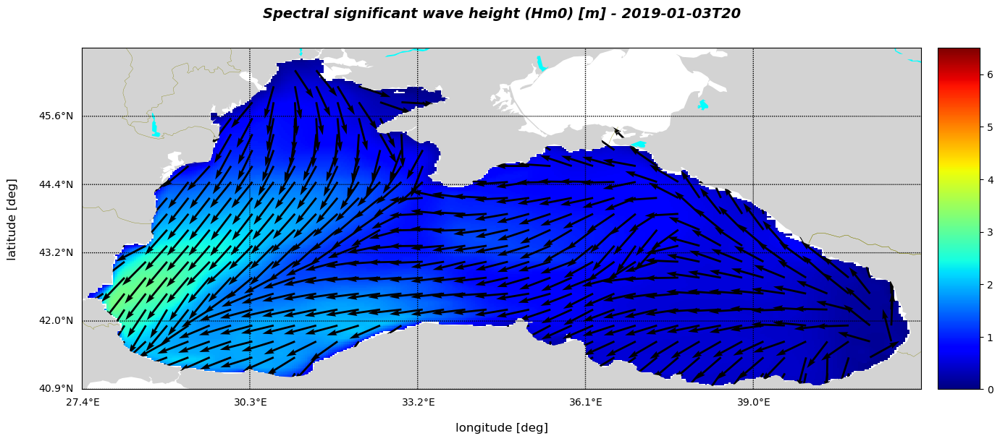

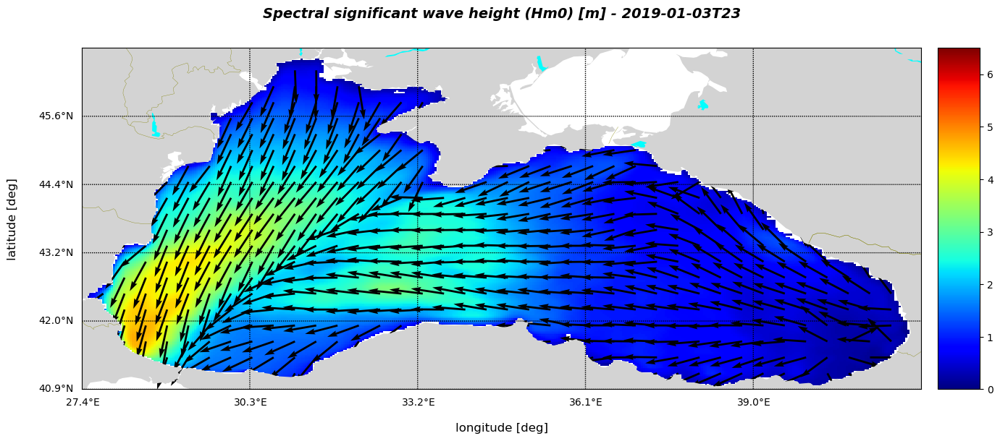

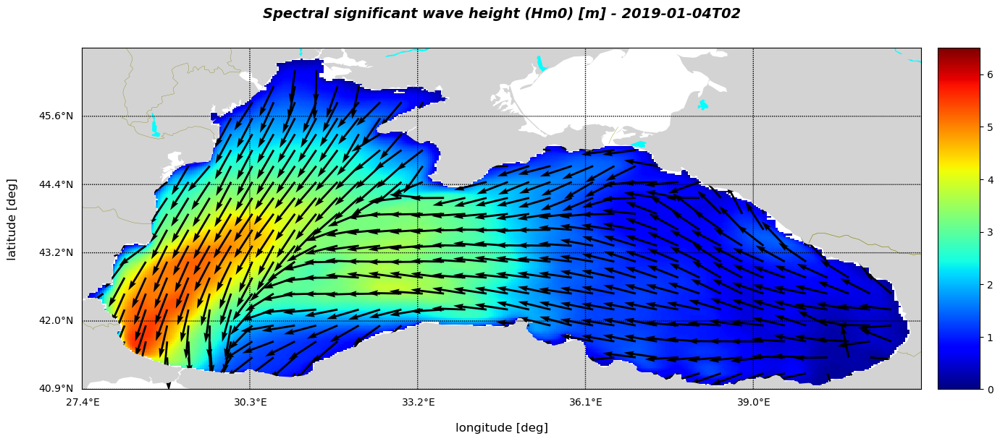

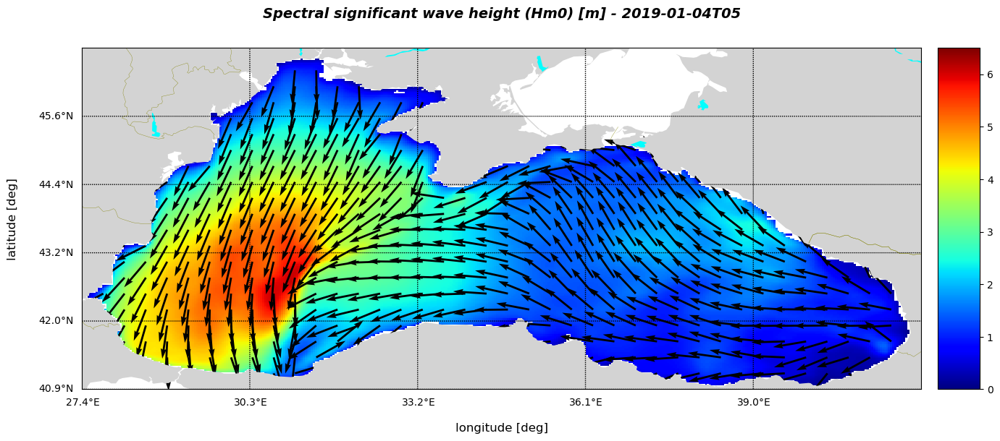

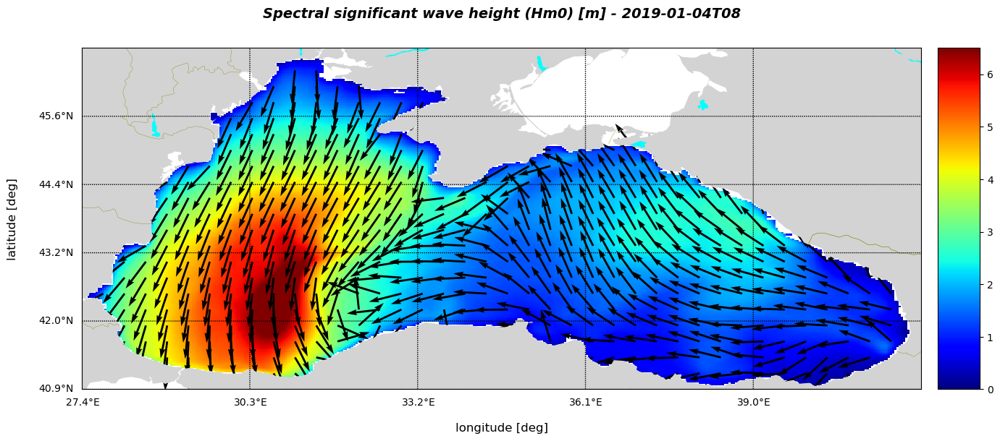

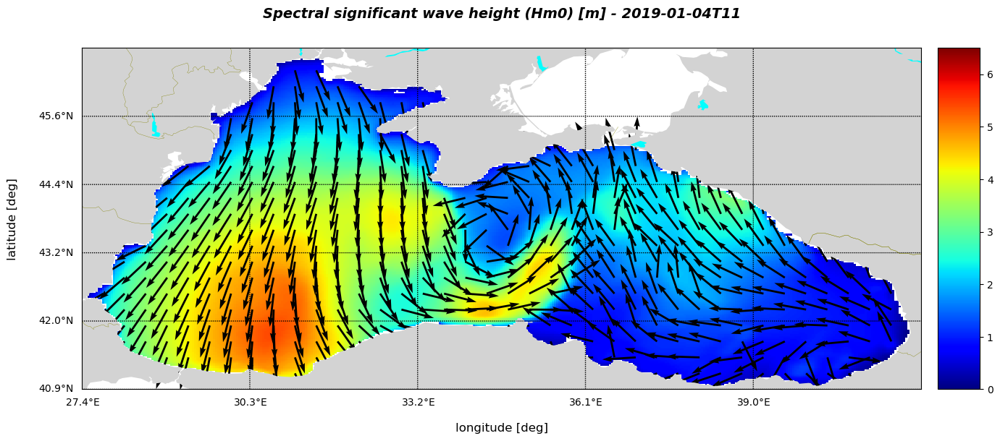

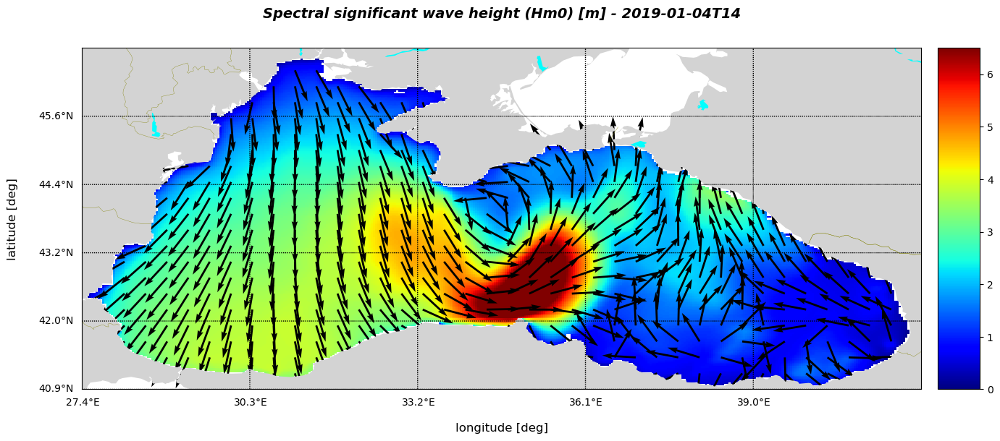

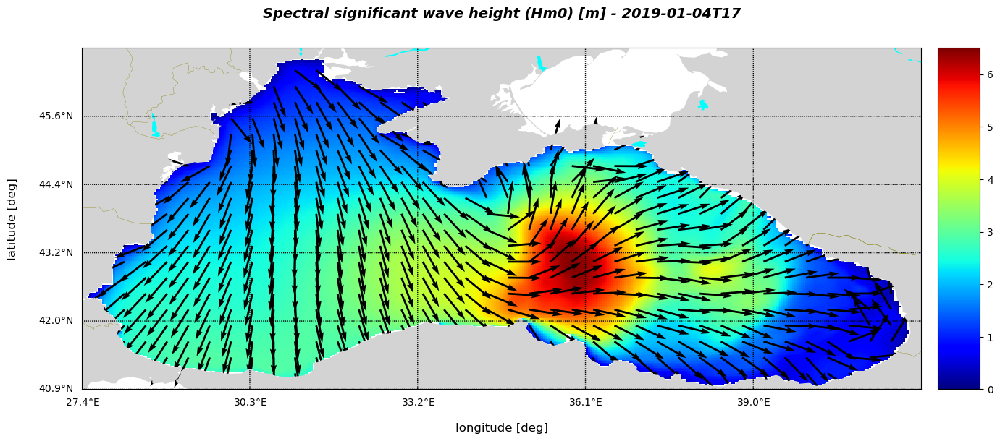

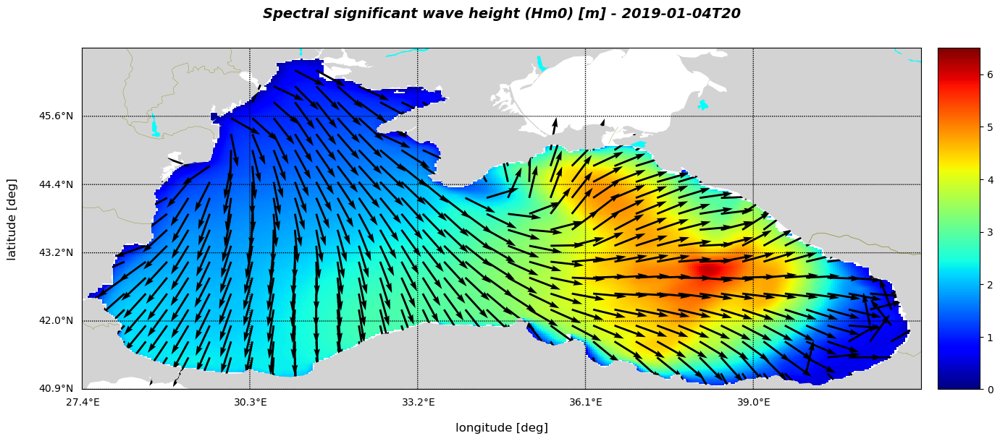

In [262]:
width_inch = 16
height_inch = 8

map_config = { 
    "llcrnrlat": lat_min,
    "llcrnrlon": lon_min,
    "urcrnrlat": lat_max,
    "urcrnrlon": lon_max,
    "resolution": 'i',
    "epsg": 4326
}

fontsize = 14
xlabel = 'longitude [deg]'
ylabel = 'latitude [deg]'
xlabelpad = 30
ylabelpad = 60

cmap = "jet"
cbar_position = "right"

title_fontstyle = {
    "fontsize": "14",
    "fontstyle": "italic",
    "fontweight": "bold",
    "pad": 30
}

label_fontstyle = {
    "fontsize": "12",
    "labelpad": 30
}

lat_indexes = getRangeIndexes(lats, lat_min, lat_max)
lon_indexes = getRangeIndexes(lons, lon_min, lon_max)
time_indexes = getRangeIndexes(times, start_date, end_date)
depth_indexes = [0]

lats_sel = lats[lat_indexes]
lons_sel = lons[lon_indexes]

time_indexes = time_indexes[0:-1:hours_step]

for t in time_indexes:
 
    timestep = np.datetime_as_string(times[t],'h')
    
    if dataset_3D:
        data = var_sel[t, d, lat_indexes, lon_indexes]
    else: 
        data = var_sel[t, lat_indexes, lon_indexes]

    plt.figure(figsize=(width_inch, height_inch))

    map = Basemap(**map_config)

    min_value = data.min() if min_value is None else min_value
    max_value = data.max() if max_value is None else max_value
    step_value = 0.5
    contour_levels = np.arange(min_value, max_value, step_value)

    x = np.linspace(0, map.urcrnrx, data.shape[1])
    y = np.linspace(0, map.urcrnry, data.shape[0])
    
    xx, yy = np.meshgrid(lons_sel, lats_sel)

    colormesh = map.pcolormesh(xx, yy, data, vmin=min_value, vmax=max_value, cmap=cmap)

    u, v = decompose_wave_direction(var_sel_dir[t, lat_indexes, lon_indexes])
    
    u_skip = u[::skip_points, ::skip_points]
    v_skip = v[::skip_points, ::skip_points]
    xx_skip = xx[::skip_points, ::skip_points]
    yy_skip = yy[::skip_points, ::skip_points]
    map.quiver(xx_skip, yy_skip, u_skip, v_skip, scale=25)

    step_lat = float((lat_max - lat_min) / 5)
    step_lon = float((lon_max - lon_min) / 5)

    parallels = np.arange(lat_min, lat_max, step_lat)
    meridians = np.arange(lon_min, lon_max, step_lon) 

    map.drawmeridians(meridians, labels=[0,0,0,1], fmt="%2.1f")
    map.drawparallels(parallels, labels=[1,0,0,0], fmt="%2.1f")

    map.colorbar(colormesh, cbar_position)

    map.drawcountries(linewidth=0.25, color='olive')
    map.fillcontinents(color='lightgray',lake_color='aqua')

    title_sel = data.long_name
    timestep = np.datetime_as_string(times[t],'h')
    var_str = "{} [{}]".format(title_sel, data.units)
    if dataset_3D:
        depth_str = "{:.2f}{}".format(float(data[depth_name]), "[m]")
        title = ' - '.join((var_str, timestep, depth_str))
    else:
        title = ' - '.join((var_str, timestep))

    plt.title(title, **title_fontstyle)
    plt.xlabel(xlabel, labelpad=xlabelpad, fontsize=12)
    plt.ylabel(ylabel, labelpad=ylabelpad, fontsize=12)    

    output_file = os.path.join(out_path,title.replace(' ','_')) + ".png"

    plt.savefig(output_file)

    plt.show()
    
    plt.close()

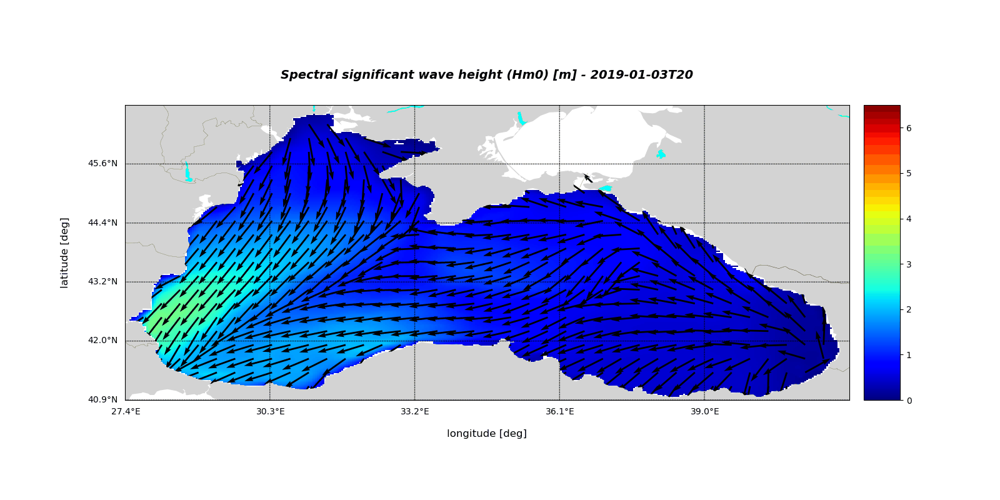

In [263]:
image_path = Path('out/animation')
images = sorted(image_path.glob('Spectral_significant_wave_height_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))

imageio.mimwrite('out/animation/Waves_animated.gif',image_list,duration=0.5,loop=10)

with open('out/animation/Waves_animated.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

In [183]:
#wave power

In [264]:
var_sel = 0.5 * wav_ds[hs_name]**2 * wav_ds[wper_name]

var_sel_dir = wav_ds[wdir_name]

lats = var_sel[lat_name]
lons = var_sel[lon_name]
times = var_sel[time_name]

dataset_3D = False
if depth_name in var_sel.coords:
    dataset_3D = True

lat_min = lats.min()
lat_max = lats.max()
lon_min = lons.min()
lon_max = lons.max()

min_value, max_value = 0, 150

start_date = np.datetime64(datetime.datetime(2019,1,3,20))
end_date = np.datetime64(datetime.datetime(2019,1,4,23))

hours_step = 3

skip_points = 10 

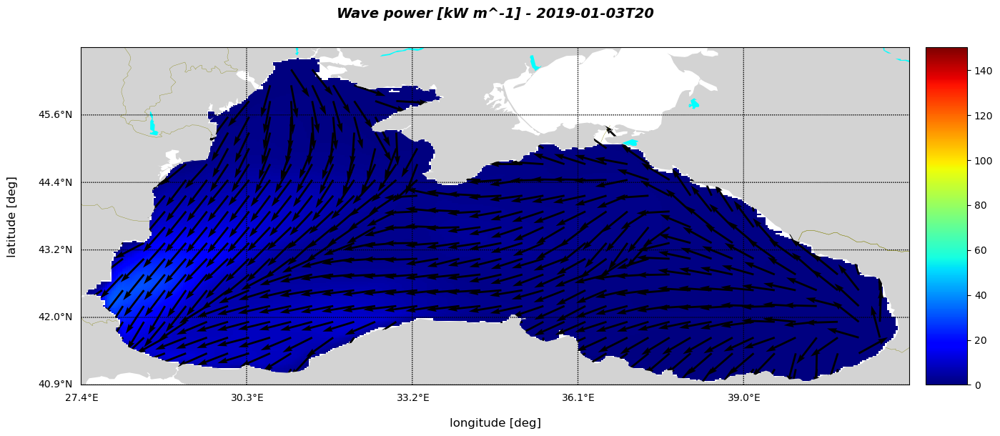

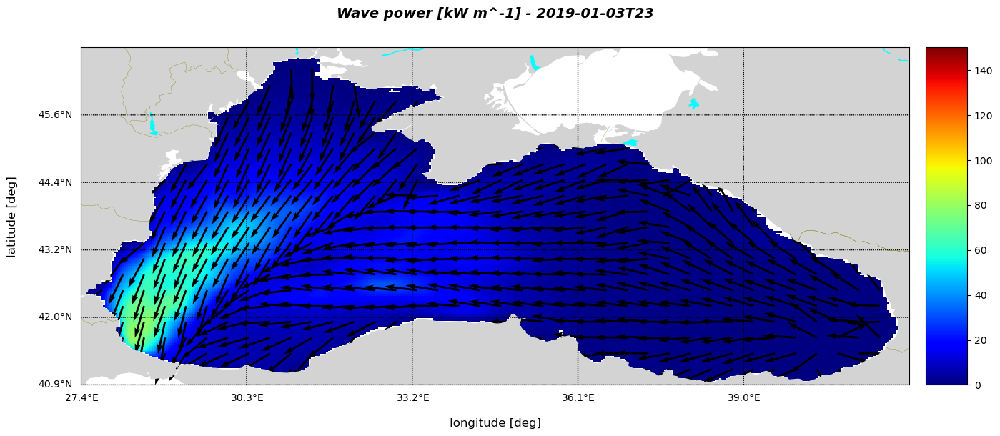

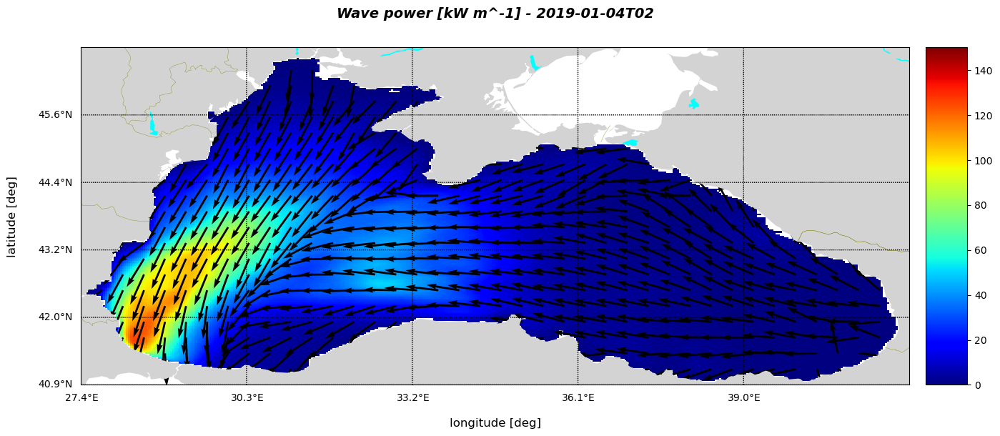

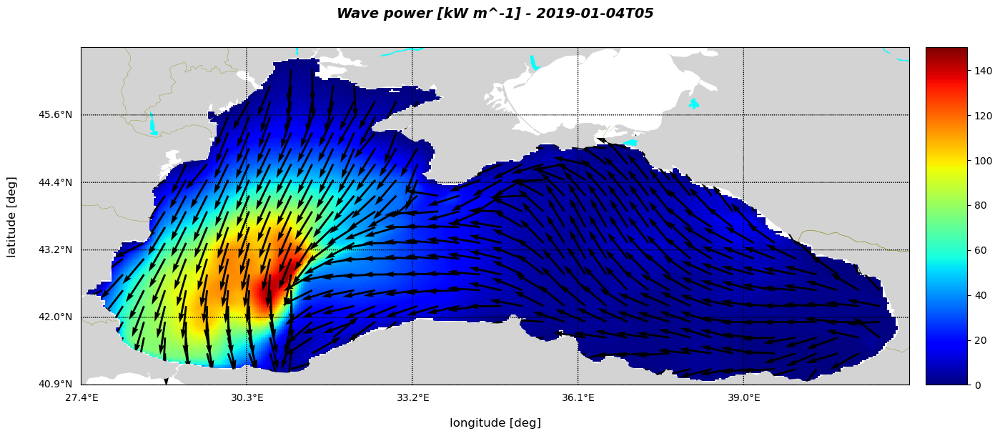

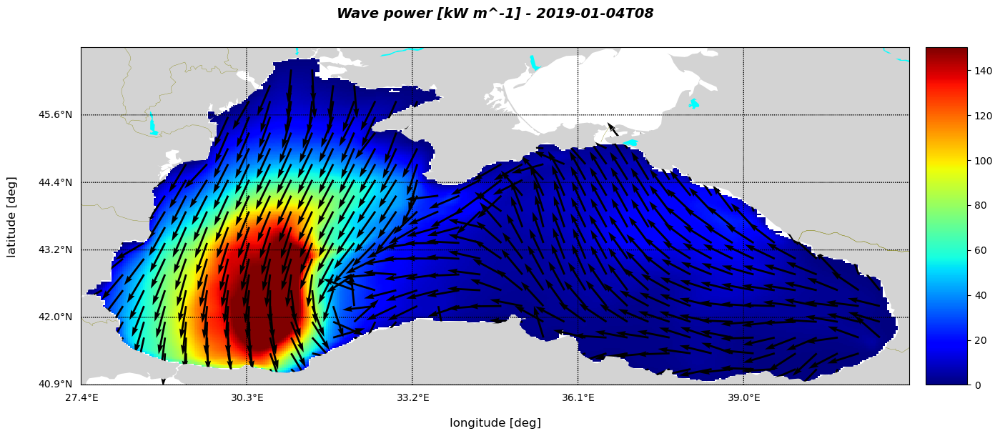

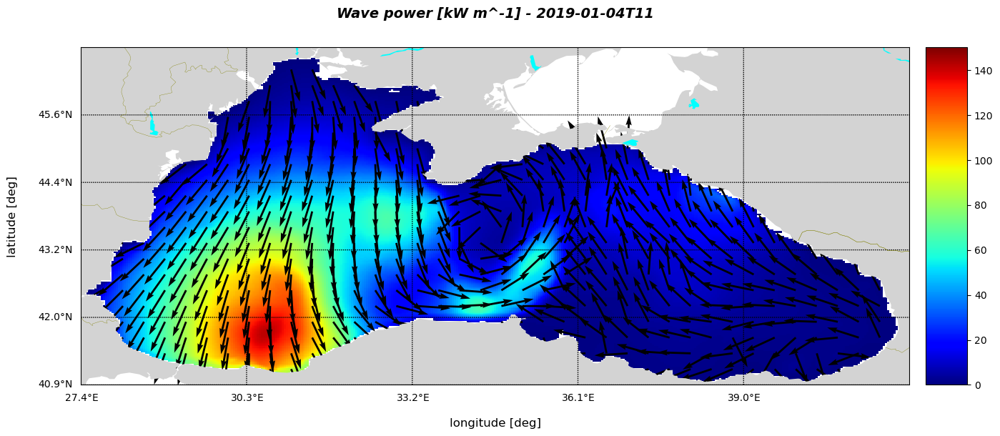

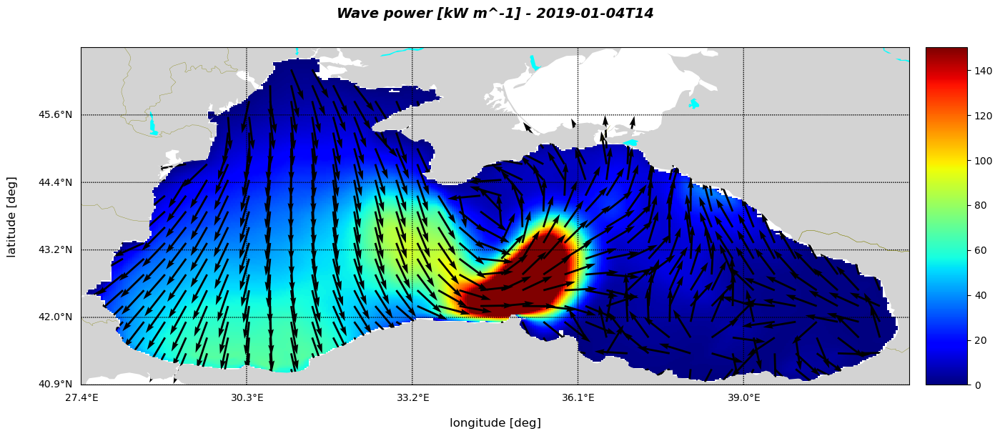

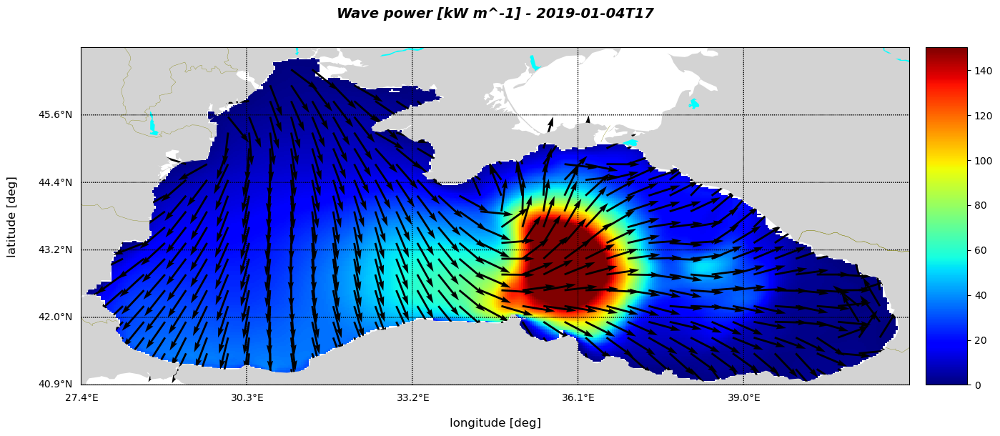

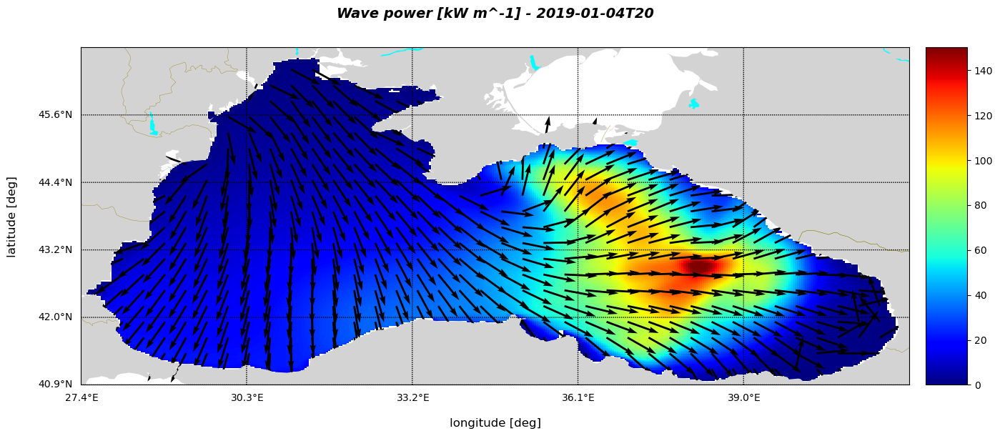

In [265]:
width_inch = 16
height_inch = 8

map_config = { 
    "llcrnrlat": lat_min,
    "llcrnrlon": lon_min,
    "urcrnrlat": lat_max,
    "urcrnrlon": lon_max,
    "resolution": 'i',
    "epsg": 4326
}

fontsize = 14
xlabel = 'longitude [deg]'
ylabel = 'latitude [deg]'
xlabelpad = 30
ylabelpad = 60

cmap = "jet"
cbar_position = "right"

title_fontstyle = {
    "fontsize": "14",
    "fontstyle": "italic",
    "fontweight": "bold",
    "pad": 30
}

label_fontstyle = {
    "fontsize": "12",
    "labelpad": 30
}

lat_indexes = getRangeIndexes(lats, lat_min, lat_max)
lon_indexes = getRangeIndexes(lons, lon_min, lon_max)
time_indexes = getRangeIndexes(times, start_date, end_date)
depth_indexes = [0]

lats_sel = lats[lat_indexes]
lons_sel = lons[lon_indexes]

time_indexes = time_indexes[0:-1:hours_step]

for t in time_indexes:
 
    timestep = np.datetime_as_string(times[t],'h')
    
    if dataset_3D:
        data = var_sel[t, d, lat_indexes, lon_indexes]
    else: 
        data = var_sel[t, lat_indexes, lon_indexes]

    plt.figure(figsize=(width_inch, height_inch))

    map = Basemap(**map_config)

    min_value = data.min() if min_value is None else min_value
    max_value = data.max() if max_value is None else max_value
    step_value = 0.5
    contour_levels = np.arange(min_value, max_value, step_value)

    x = np.linspace(0, map.urcrnrx, data.shape[1])
    y = np.linspace(0, map.urcrnry, data.shape[0])
    xx, yy = np.meshgrid(lons_sel, lats_sel)
    colormesh = map.pcolormesh(xx, yy, data, vmin=min_value, vmax=max_value, cmap=cmap)

    u, v = decompose_wave_direction(var_sel_dir[t, lat_indexes, lon_indexes])
    
    u_skip = u[::skip_points, ::skip_points]
    v_skip = v[::skip_points, ::skip_points]
    xx_skip = xx[::skip_points, ::skip_points]
    yy_skip = yy[::skip_points, ::skip_points]
    map.quiver(xx_skip, yy_skip, u_skip, v_skip, scale=25)

    step_lat = float((lat_max - lat_min) / 5)
    step_lon = float((lon_max - lon_min) / 5)

    parallels = np.arange(lat_min, lat_max, step_lat)
    meridians = np.arange(lon_min, lon_max, step_lon) 

    map.drawmeridians(meridians, labels=[0,0,0,1], fmt="%2.1f")
    map.drawparallels(parallels, labels=[1,0,0,0], fmt="%2.1f")

    map.colorbar(colormesh, cbar_position)

    map.drawcountries(linewidth=0.25, color='olive')
    map.fillcontinents(color='lightgray',lake_color='aqua')

    title_sel = "Wave power"
    timestep = np.datetime_as_string(times[t],'h')
    var_str = "{} [{}]".format(title_sel, "kW m^-1") 
    if dataset_3D:
        depth_str = "{:.2f}{}".format(float(data[depth_name]), "[m]")
        title = ' - '.join((var_str, timestep, depth_str))
    else:
        title = ' - '.join((var_str, timestep))

    plt.title(title, **title_fontstyle)
    plt.xlabel(xlabel, labelpad=xlabelpad, fontsize=12)
    plt.ylabel(ylabel, labelpad=ylabelpad, fontsize=12)    

    output_file = os.path.join(out_path,title.replace(' ','_')) + ".png"

    plt.savefig(output_file)

    plt.show()

    plt.close()

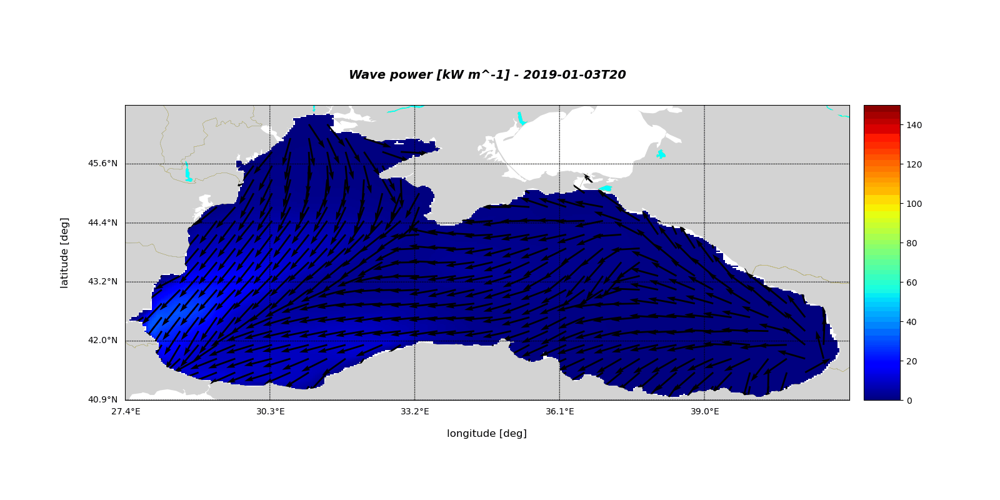

In [266]:
image_path = Path('out/animation')
images = sorted(image_path.glob('Wave_power_*.png'))
image_list = []
for file_name in images:
    image_list.append(imageio.imread(file_name))

imageio.mimwrite('out/animation/Wave_power_animated.gif',image_list,duration=0.5,loop=10)

with open('out/animation/Wave_power_animated.gif','rb') as f:
    display(Image(data=f.read(),format='png'))

In [267]:
wav_hi_f = "07-02-B.nc"
wav_hi_nc = os.path.join(data_path, wav_hi_f)
wav_hi_ds = xr.open_dataset(wav_hi_nc)

In [275]:
point = {'x': 28.30, 'y': 43.00}
ds_sel = wav_hi_ds.sel(lat=point['y'], lon=point['x'], method='nearest')
ds_sel

<xarray.Dataset>
Dimensions:  (time: 87649)
Coordinates:
    lon      float32 28.3
  * time     (time) datetime64[ns] 2008-12-31T11:00:00 ... 2018-12-31T11:00:00
    lat      float32 43.0
Data variables:
    VHM0     (time) float32 ...
    VMDR     (time) float32 ...
    VTM10    (time) float32 ...
Attributes: (12/13)
    bulletim_type:                   reanalysis
    institution:                     Helmholtz Centre for Coastal Research - ...
    source:                          WAM Cycle 4.6
    contact:                         servicedesk.cmems@mercator-ocean.eu
    references:                      Please check in CMEMS catalogue the INFO...
    comment:                         Please check in CMEMS catalogue the INFO...
    ...                              ...
    bulletin_date:                   20190401
    FROM_ORIGINAL_FILE__field_type:  hourly_instantaneous_at_time_field
    title:                           Wave Products (2D) - Instantaneous Field
    _CoordSysBuilder:                ucar.nc2.dataset.conv.CF1Convention
    Conventions:                     CF-1.0
    history:                         Data extracted from dataset http://local...

In [276]:
hs_sel = ds_sel[hs_name].round(2)
hs_sel

<xarray.DataArray 'VHM0' (time: 87649)>
array([0.94, 0.9 , 0.88, ..., 0.3 , 0.28, 0.27], dtype=float32)
Coordinates:
    lon      float32 28.3
  * time     (time) datetime64[ns] 2008-12-31T11:00:00 ... 2018-12-31T11:00:00
    lat      float32 43.0
Attributes:
    standard_name:  sea_surface_wave_significant_height
    long_name:      Spectral significant wave height (Hm0)
    units:          m
    Coordinates:    time lat lon

In [277]:
dir_sel = ds_sel[wdir_name].astype(int)
dir_sel

<xarray.DataArray 'VMDR' (time: 87649)>
array([12, 12, 12, ..., 47, 47, 47])
Coordinates:
    lon      float32 28.3
  * time     (time) datetime64[ns] 2008-12-31T11:00:00 ... 2018-12-31T11:00:00
    lat      float32 43.0
Attributes:
    standard_name:  sea_surface_wave_from_direction
    long_name:      Mean wave direction from (Mdir)
    units:          degree
    Coordinates:    time lat lon

In [279]:
hs_min = 0.5
hs_max = 5
hs_step = 0.25

bin_hs = np.arange(hs_min, hs_max, hs_step)

bin_dir = 24 
dir_sel_rot = dir_sel.copy()
dir_sel_rot = (dir_sel_rot + 180) % 360

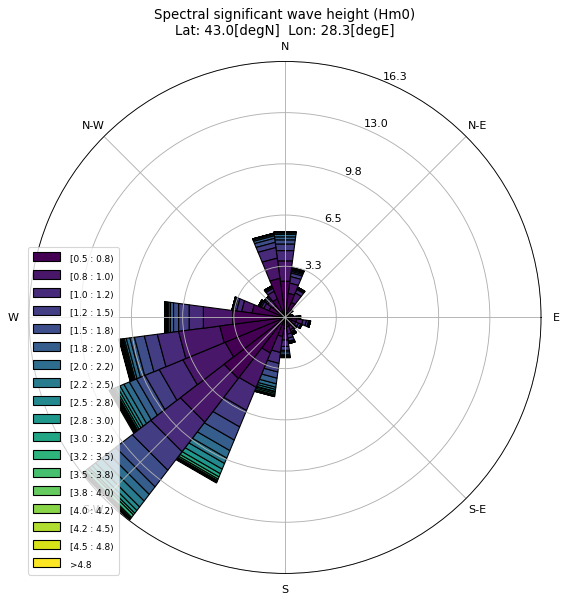

In [280]:
def plot_waverose(ds, normed):
    var_title = ds.long_name

    title = '{}\n' \
            'Lat: {y}[degN]  Lon: {x}[degE]'.format(var_title, y = point['y'], x = point['x'])

    ax = windrose.WindroseAxes.from_ax()
    ax.bar(dir_sel_rot.data, hs_sel.data, bins=bin_hs, nsector=bin_dir, normed=normed, opening=1, edgecolor='k')

    ax.legend(title='Hs')
    ax.set_legend(prop={'size': 'large'})

    plt.title(title)

    output_file = os.path.join(out_path, 'WavesHeightWindrose') + ".png"

    plt.savefig(output_file)
    plt.show()
    plt.close()
    
    table = ax._info['table']
    return table

t_normed = plot_waverose(wav_hi_ds[hs_name], True)